# A method for classifying hydrological alteration

In [1]:
from hidrocomp.series import Flow
import math
import pandas as pd
import plotly as py
import plotly.graph_objects as go

In [2]:
flow_ana = Flow(data=pd.read_csv("ana.csv", index_col=0, parse_dates=True))
flow_sar = Flow(data=pd.read_csv("sar.csv", index_col=0, parse_dates=True))
flow_ons = Flow(data=pd.read_csv("ons.csv", index_col=0, parse_dates=True))

In [3]:
flow_ons.month_num_flood, flow_ons.month_abr_flood

(8, 'AS-AUG')

In [4]:
flow = flow_ana.data.combine_first(flow_sar.data).combine_first(flow_ons.data)
flow

,66160000,66231000,A19086,D19086,MANSO
1972-08-07,11.2110,NaN,NaN,NaN,NaN
1972-08-08,11.2110,NaN,NaN,NaN,NaN
1972-08-09,11.6272,NaN,NaN,NaN,NaN
1972-08-10,11.6272,NaN,NaN,NaN,NaN
1972-08-11,11.6272,NaN,NaN,NaN,NaN
...,...,...,...,...,...
2020-07-18,NaN,NaN,41.94,121.0,NaN
2020-07-19,NaN,NaN,34.02,121.0,NaN
2020-07-20,NaN,NaN,41.93,121.0,NaN
2020-07-21,NaN,NaN,34.02,121.0,NaN


In [5]:
flow = Flow(data=flow)

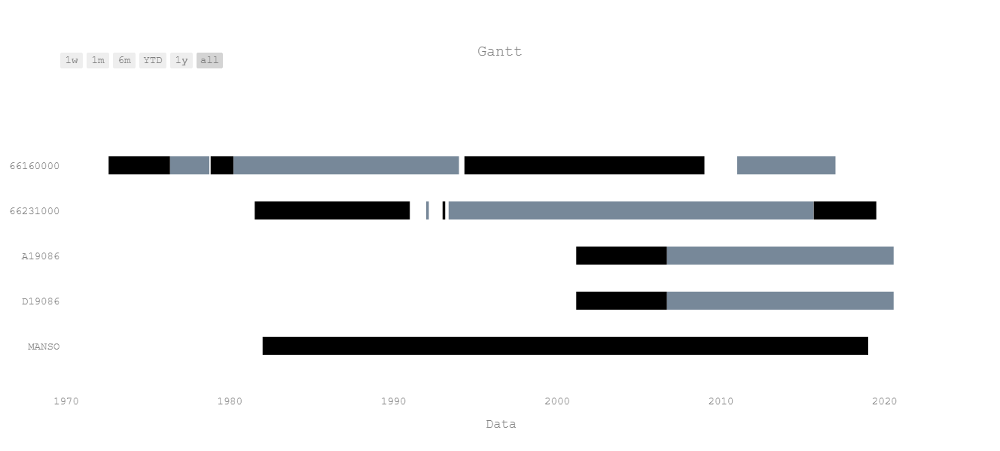

In [6]:
fig_gantt, data_gantt = flow.gantt("Gantt")
py.offline.iplot(fig_gantt)

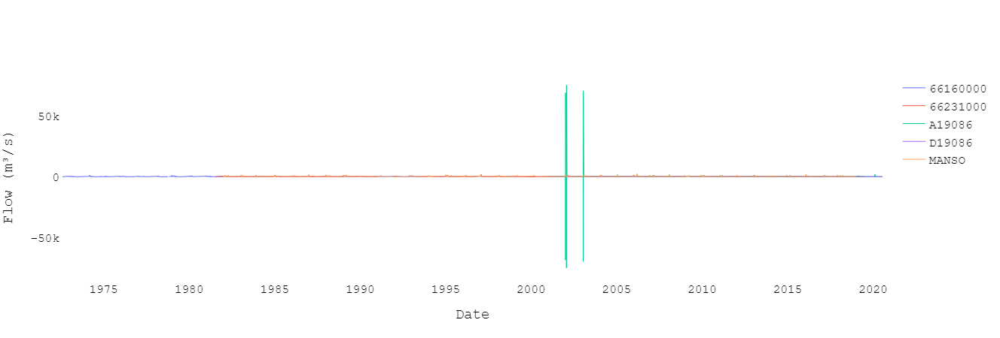

In [7]:
fig_hidro, data_hidro = flow.hydrogram("")
py.offline.iplot(fig_hidro)

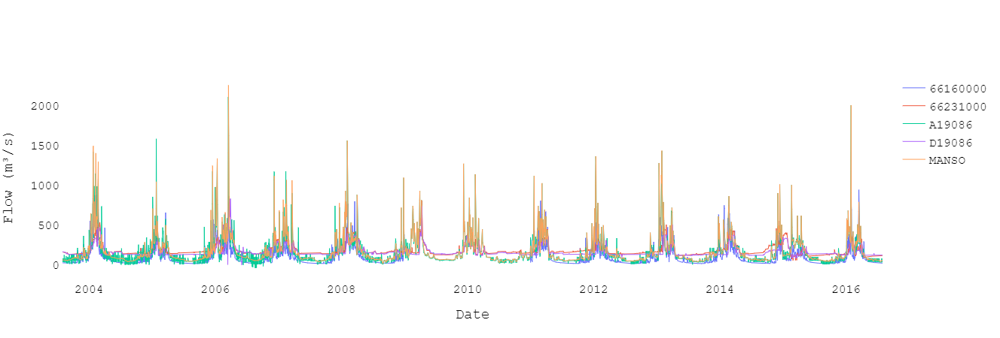

In [8]:
start_period = "01/08/2003"
end_period = "31/07/2016"
flow.date(date_start=start_period, date_end=end_period)
fig_start_filling_hydro, data_start_filling_hydro = flow.hydrogram("")
py.offline.iplot(fig_start_filling_hydro)

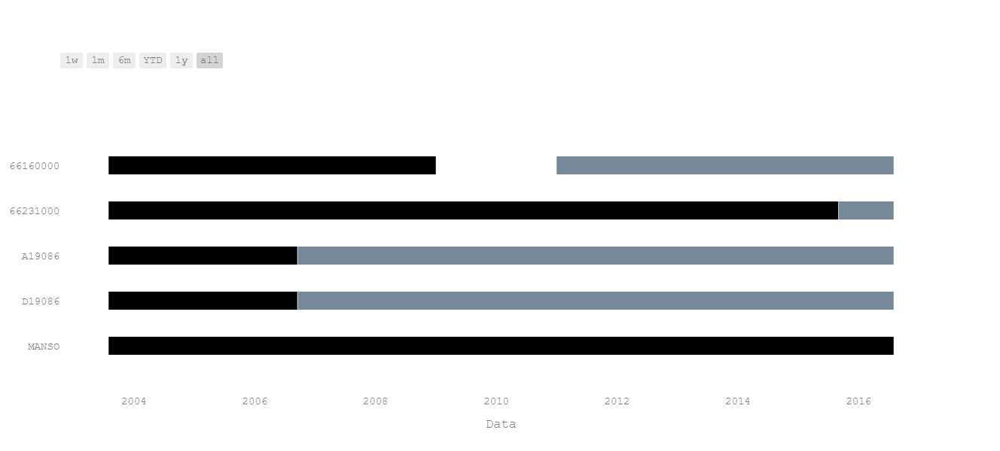

In [9]:
fig_start_filling_gantt, data_start_filling_gantt = flow.gantt("")
py.offline.iplot(fig_start_filling_gantt)

## Interpolar dados

In [10]:
nulls = flow.data["66231000"].isnull()
date_start = flow.data.loc[nulls].index[0] - pd.timedelta_range(start='1 day', periods=1, freq='D')
date_end = flow.data.loc[nulls].index[0]

date_range = pd.date_range(start=date_start.values[0], end=date_end)

delta = None
for date in date_range:
    if nulls[date]:
        flow.data["66231000"][date] = flow.data["D19086"][date] + delta
    delta = flow.data["66231000"][date] - flow.data["D19086"][date]
    
flow.data["66231000"][date_end]

120.083

Variables: 
- Magnitude:
    - 1-day maximum
    - 1-day minimum
- Duration:
    - High pulse duration
    - Low pulse duration
- Frequency:
    - High pulse count
    - Low pulse count
- Timing:
    - Date of maximum
    - Date of minimum

# Control x Impact

In [11]:
area_sb = 4260
area_ss = 9580
f"66160000: {area_sb} km²  66231000: {area_ss} km²"

'66160000: 4260 km²  66231000: 9580 km²'

In [12]:
alpha = area_ss/area_sb
alpha

2.248826291079812

In [13]:
# data.station = "66160000"
# data.date(date_start="01/09/2001")
# data_max = data.maximum()
threshold_high = flow.data["66160000"].quantile(0.75)
f"Threshold: {threshold_high}"

'Threshold: 127.0295'

In [14]:
# data_min = data.minimum()
threshold_low = flow.data["66160000"].quantile(0.50) # data_min.peaks.max().values[0]
f"Threshold: {threshold_low}"

'Threshold: 41.6645'

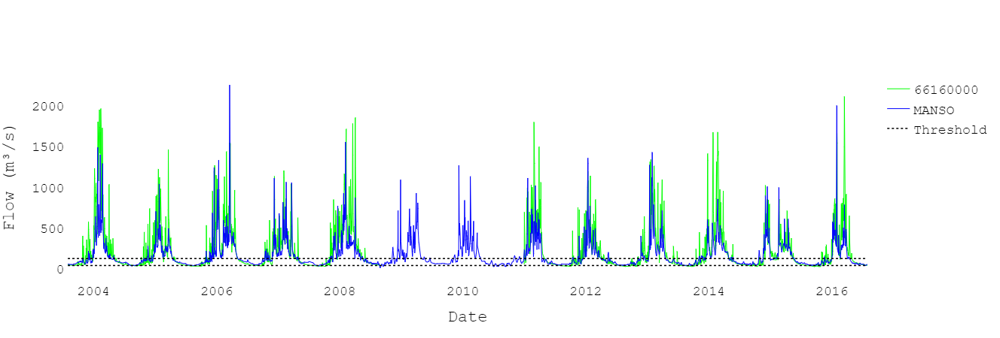

In [15]:
# del 01/09/2008 - 31/12/2008
date_del = pd.date_range(start=pd.to_datetime("31/08/2008", dayfirst=True), end=pd.to_datetime("31/12/2008", dayfirst=True))
data_mod = pd.DataFrame(flow.data["66160000"].drop(date_del, axis=0)*alpha).combine_first(flow.data["MANSO"].to_frame())
data = Flow(data=data_mod)
data_fig, data_data = data.hydrogram("", color={"MANSO": "#0000FF", "66160000": "#00FF00"}, threshold=[threshold_high, threshold_low], size_text=18)
data_fig["data"][2]["name"] = "Threshold"
data_fig["data"][3]["showlegend"] = False
py.offline.iplot(data_fig)

In [16]:
# fig_hidro = go.Figure(data_fig)
# fig_hidro.write_image("hidro_manso_quebó.png", width=1400, height=800)

# Parte 1

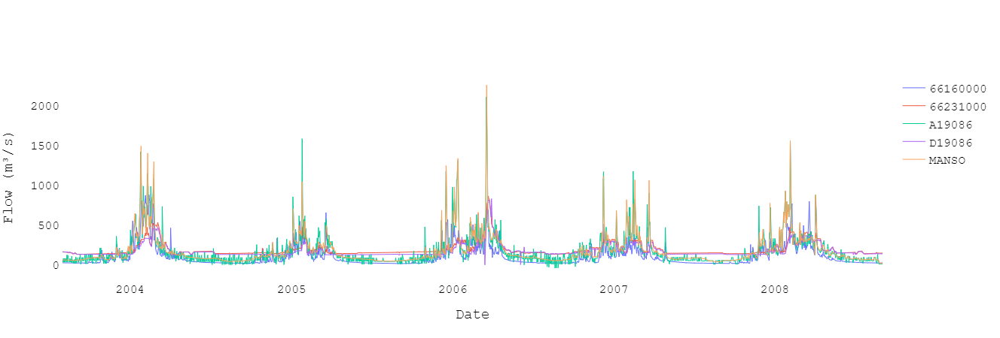

In [17]:
date_end = "01/09/2008"
flow.date(date_end=date_end)
data_fig, data_data = flow.hydrogram("")
py.offline.iplot(data_fig)

In [18]:
data_pre = Flow(data=pd.DataFrame(flow.data["66160000"]*alpha))
data_pos = Flow(data=pd.DataFrame(flow.data["66231000"])).date(date_end=date_end)
threshold_high = data_pre.data["66160000"].quantile(0.75)
threshold_low = data_pre.data["66160000"].quantile(0.50) # data_min.peaks.max().values[0]

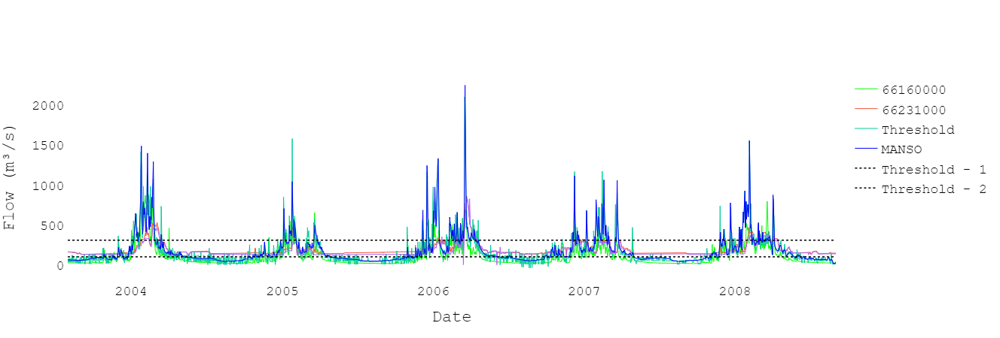

In [19]:
data_fig, data_data = flow.hydrogram("", color={"MANSO": "#0000FF", "66160000": "#00FF00"}, threshold=[threshold_high, threshold_low], size_text=18)
data_fig["data"][2]["name"] = "Threshold"
data_fig["data"][3]["showlegend"] = False
py.offline.iplot(data_fig)

## Station 66160000

## Iha

In [20]:
iha_pre = data_pre.iha(status='pre', statistic="no-parametric", central_metric="mean", month_water = 9, variation_metric="std", type_threshold="stationary", 
                   threshold_high=threshold_high, threshold_low=threshold_low, type_criterion="autocorrelation", duration=1, 
                   aspects=["Magnitude and Duration", "Frequency and Duration", "Timing Extreme"], magnitude_and_duration=["1-day maximum", "1-day minimum"], 
                   timing=["Date of maximum", "Date of minimum"])

In [21]:
iha_pre.summary()

,Coeff. of Var.,Means
1-day maximum,144.945647,675.788761
1-day minimum,4.881737,64.486980
High pulse count,7.661593,13.500000
Low pulse count,4.147288,6.000000
High pulse duration,3.151504,6.301106
Low pulse duration,13.481332,29.331111
Date of maximum,32.425596,189.310544
Date of minimum,14.223814,282.326667


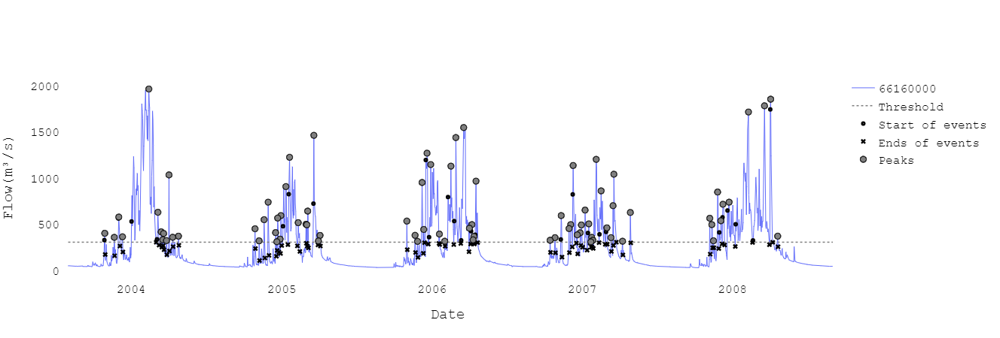

In [22]:
fig_events_high, data_events_high = iha_pre.events_high.plot_hydrogram("")
py.offline.iplot(fig_events_high)

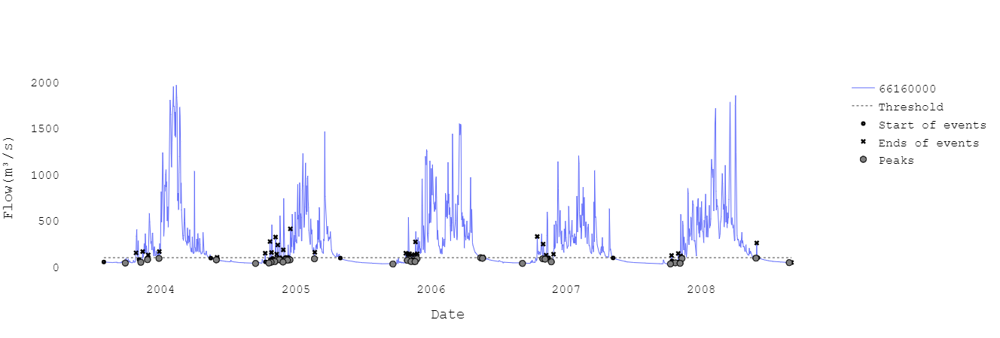

In [23]:
fig_events_low, data_events_low = iha_pre.events_low.plot_hydrogram("")
py.offline.iplot(fig_events_low)

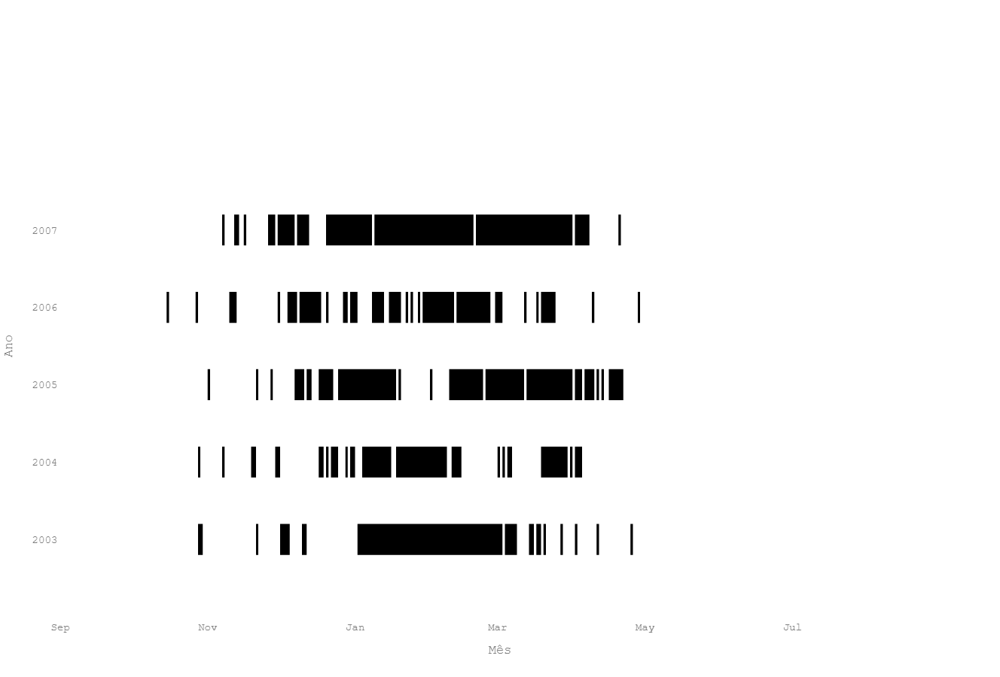

In [24]:
fig_events_spells_high, data_events_spells_high = iha_pre.events_high.plot_spells("")
py.offline.iplot(fig_events_spells_high)

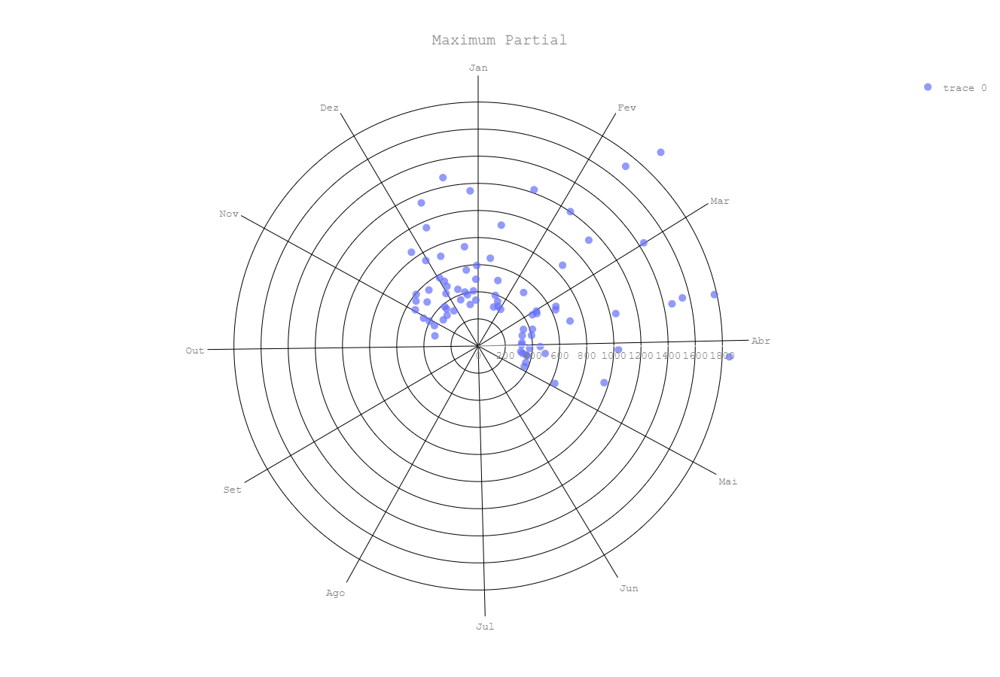

In [25]:
fig_events_polar_high, data_events_polar_high = iha_pre.events_high.plot_polar()
py.offline.iplot(fig_events_polar_high)

## Station 66231000

In [26]:
iha_pos = data_pos.iha(status='pos', statistic="no-parametric", central_metric="mean", month_water = 9, variation_metric="std", type_threshold="stationary", 
                   threshold_high=threshold_high, threshold_low=threshold_low, type_criterion="autocorrelation", duration=1,  
                   aspects=["Magnitude and Duration", "Frequency and Duration", "Timing Extreme"], magnitude_and_duration=["1-day maximum", "1-day minimum"], 
                   timing=["Date of maximum", "Date of minimum"])

In [27]:
iha_pos.summary()

,Coeff. of Var.,Means
1-day maximum,74.253851,411.901363
1-day minimum,NaN,NaN
High pulse count,4.501851,4.666667
Low pulse count,0.000000,0.000000
High pulse duration,6.431202,10.159394
Low pulse duration,NaN,NaN
Date of maximum,49.763237,66.185859
Date of minimum,NaN,NaN


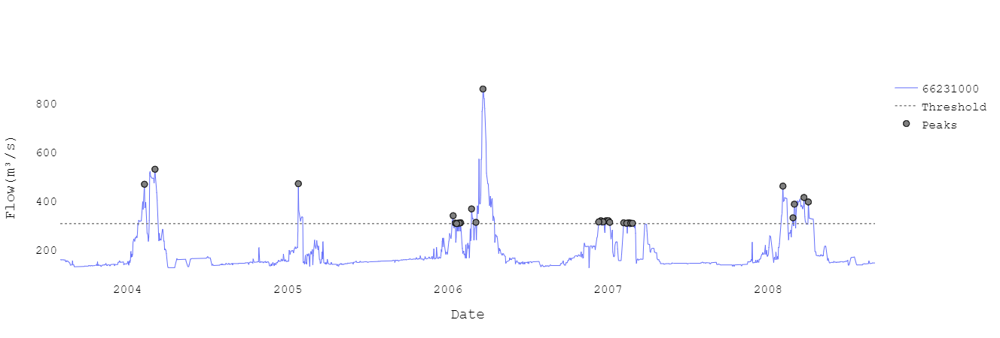

In [28]:
fig_events_high_pos, data_events_high_pos = iha_pos.events_high.plot_hydrogram("", point_start_end=False)
py.offline.iplot(fig_events_high_pos)

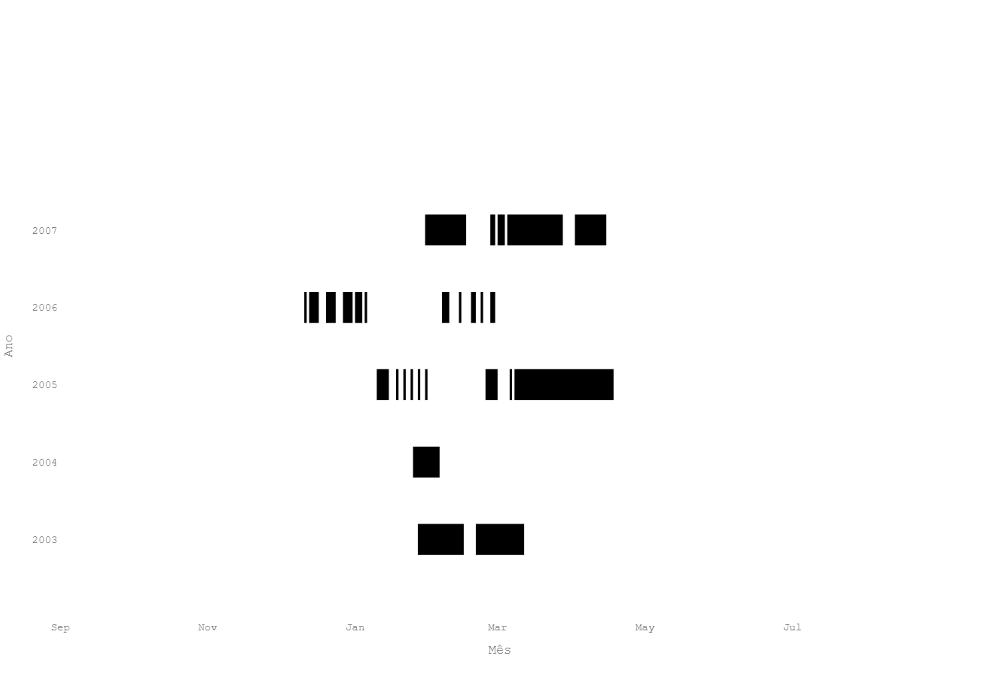

In [29]:
fig_events_spells_high_pos, data_events_spells_high_pos = iha_pos.events_high.plot_spells("")
py.offline.iplot(fig_events_spells_high_pos)

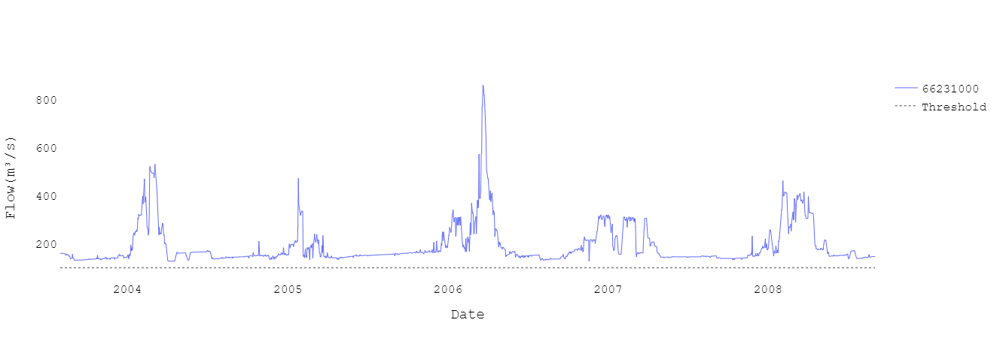

In [30]:
fig_events_low_pos, data_events_low_pos = iha_pos.events_low.plot_hydrogram("")
py.offline.iplot(fig_events_low_pos)

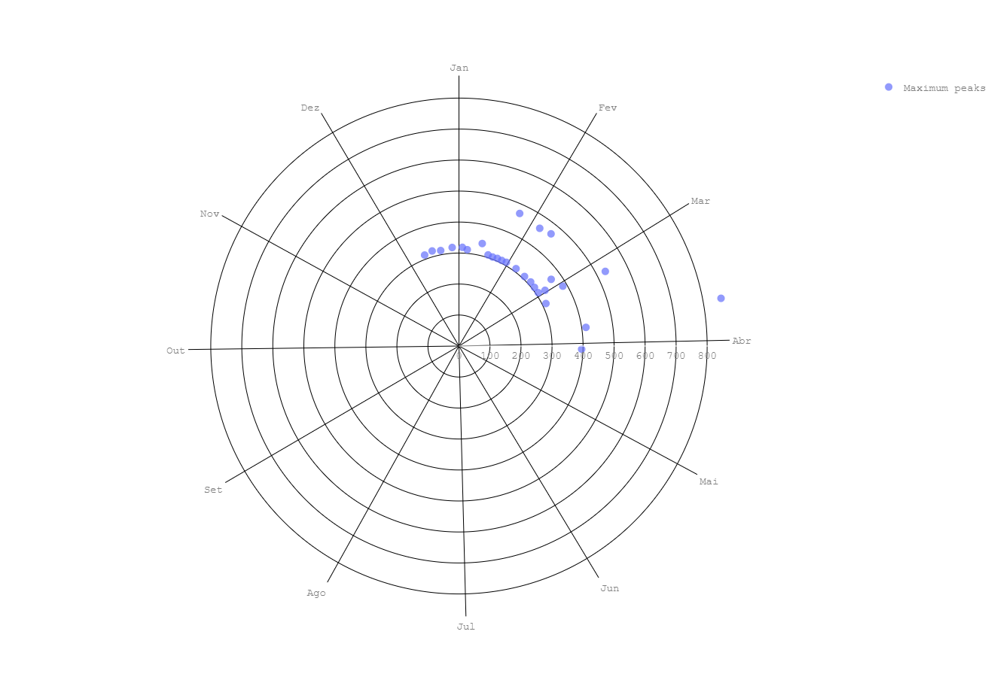

In [31]:
fig_events_polar_high_pos, data_events_polar_high_pos = iha_pos.events_high.plot_polar("")
py.offline.iplot(fig_events_polar_high_pos)

In [32]:
era = iha_pre.era(iha_obs=iha_pos)

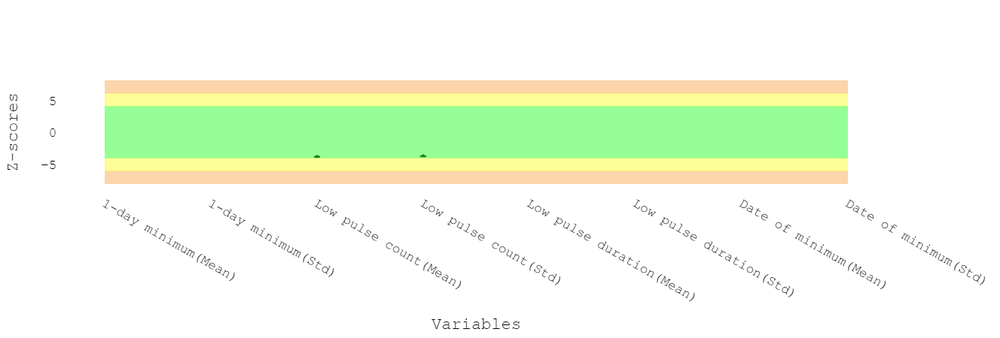

In [33]:
fig_low, data = era.plot(by_type_events="Low", showlegend=False, size_text=18)
py.offline.iplot(fig_low)

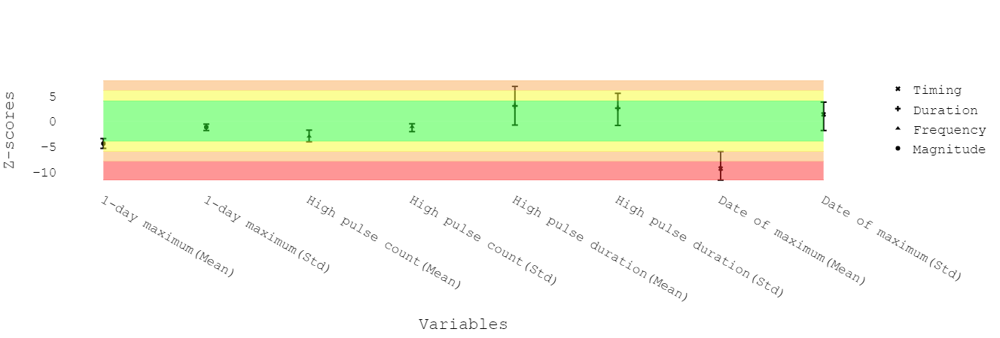

In [34]:
fig_high, data = era.plot(by_type_events="High", showlegend=True, size_text=18)
py.offline.iplot(fig_high)

In [35]:
# fig_low.write_image("Zscore_low.png", width=800, height=800)
# fig_high.write_image("Zscore_high.png", width=800, height=800)

In [36]:
era.values_mean()

1-day maximum         -4.465621
1-day minimum               NaN
Date of maximum       -9.435224
Date of minimum             NaN
High pulse count      -3.058264
High pulse duration    2.983839
Low pulse count       -3.813695
Low pulse duration          NaN
Name: Pos - mean, dtype: float64